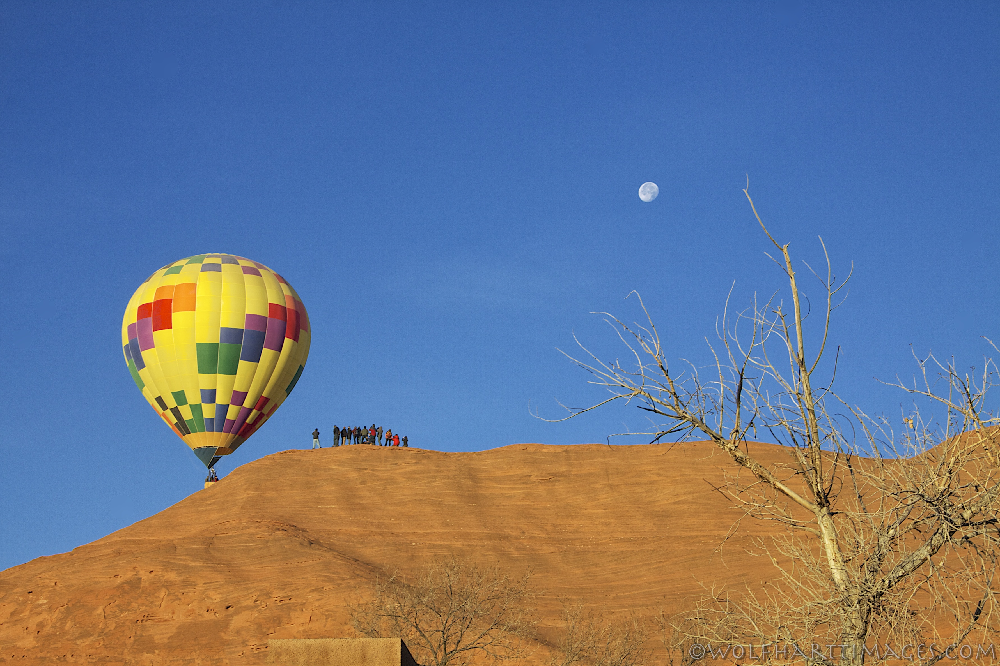

Image


In [ ]:
import cv2
from google.colab.patches import cv2_imshow
# Load image
image = cv2.imread('/content/ballooning_0.jpg')

# Convert to grayscale
# gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Calculate saliency map
saliency = cv2.saliency.StaticSaliencyFineGrained_create()
(success, saliencyMap) = saliency.computeSaliency(image)

# Normalize saliency map
saliencyMap = (saliencyMap * 255).astype("uint8")

# Apply binary thresholding to create binary mask
ret, binaryMap = cv2.threshold(saliencyMap, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Show original image and saliency map
cv2_imshow(image)
print("Image")



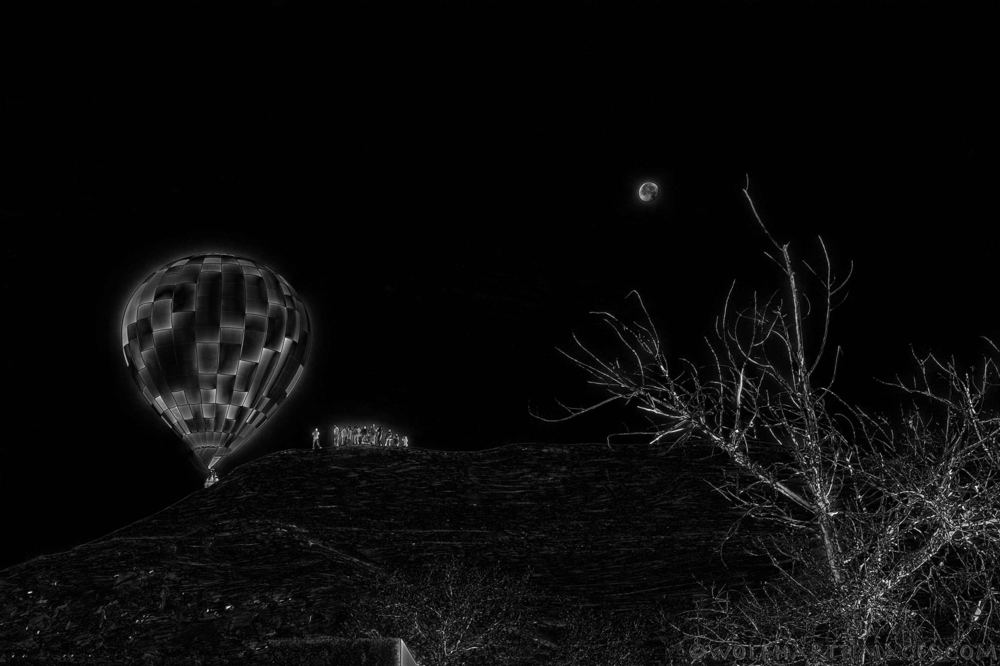

Saliency Map


In [ ]:
cv2_imshow(saliencyMap)
print("Saliency Map")


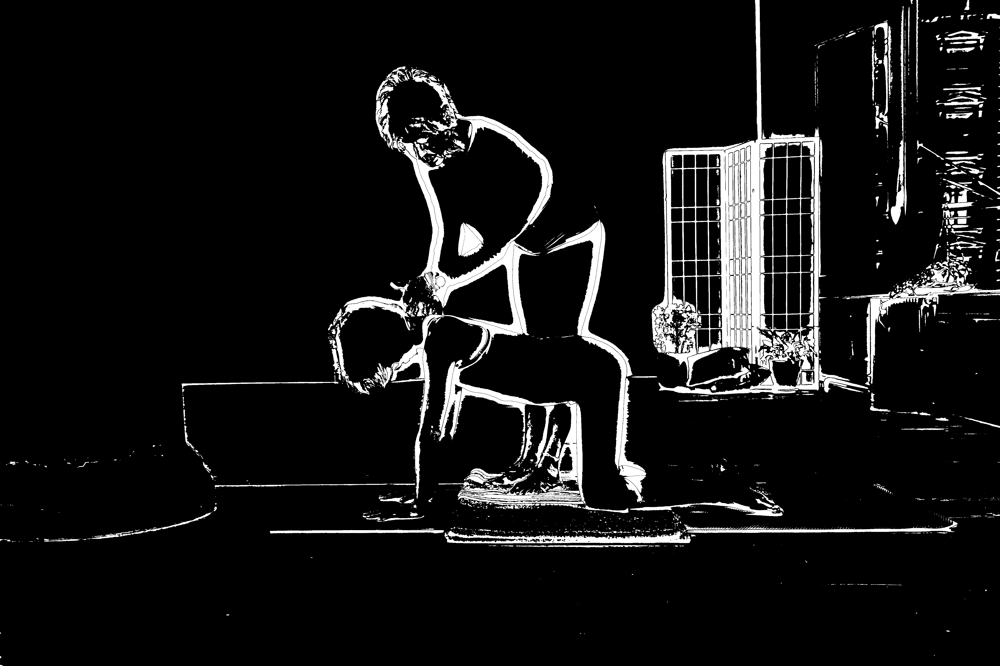

Binary Map


In [ ]:
cv2_imshow(binaryMap)
print("Binary Map")

In [ ]:
from skimage import io, transform, color, feature
import numpy as np
# Load image
# image = io.imread('/content/dancing_0.jpg')
def calculate_amr_features(image):
# Convert to grayscale
  gray = color.rgb2gray(image)

  # Define parameters
  num_levels = 6
  sigma = 1

  # Generate Gaussian pyramid
  pyramid = tuple(transform.pyramid_gaussian(gray, max_layer=num_levels - 1, sigma=sigma))

  # Calculate AMR features
  features = []
  for i in range(num_levels):
      features.append(feature.hog(pyramid[i], orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2), block_norm='L2'))

  # Concatenate features
  amr_features = features[0]
  for i in range(1, num_levels):
      amr_features = np.concatenate((amr_features, features[i]))

  # Print feature vector
  print(amr_features)
  return amr_features


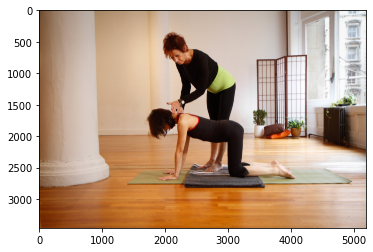

[0.24037222 0.         0.05054846 ... 0.03033515 0.00600291 0.02922267]


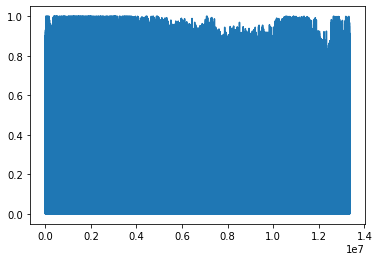

In [ ]:
import matplotlib.pyplot as plt

# Load and display original image
image = io.imread('/content/arching_2.jpg')
plt.imshow(image)
plt.show()

# Calculate and display AMR feature vector
amr_features = calculate_amr_features(image)
plt.plot(amr_features)
plt.show()
  

In [ ]:
import numpy as np

def visualize_amr_features(image, amr_features):
    # Normalize feature values to [0, 255]
    feature_min = np.min(amr_features)
    feature_max = np.max(amr_features)
    feature_range = feature_max - feature_min
    amr_features_norm = ((amr_features - feature_min) / feature_range) * 255
    
    # Resize AMR feature vector to match image size
    amr_features_resized = transform.resize(amr_features_norm, image.shape[:2], order=0, anti_aliasing=False)
    
    # Create RGB image with AMR features as grayscale values
    amr_image = np.zeros_like(image)
    amr_image[:,:,0] = amr_features_resized
    amr_image[:,:,1] = amr_features_resized
    amr_image[:,:,2] = amr_features_resized
    
    # Display original image and AMR feature image side-by-side
    fig, ax = plt.subplots(ncols=2, figsize=(10,5))
    ax[0].imshow(image)
    ax[0].set_title('Original Image')
    ax[1].imshow(amr_image)
    ax[1].set_title('AMR Feature Image')
    plt.show()


In [ ]:
image = io.imread('/content/dancing_0.jpg')
amr_features = calculate_amr_features(image)
visualize_amr_features(image,amr_features)

FileNotFoundError: ignored

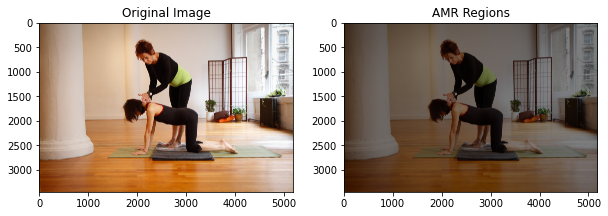

In [ ]:
from skimage.transform import resize

def visualize_amr_regions(image, amr_features, threshold):
    # Normalize feature values to [0, 1]
    feature_min = np.min(amr_features)
    feature_max = np.max(amr_features)
    feature_range = feature_max - feature_min
    amr_features_norm = (amr_features - feature_min) / feature_range
    
    # Resize feature vector to match image size
    amr_features_resized = resize(amr_features_norm, image.shape[:2], order=0, anti_aliasing=False)
    
    # Generate binary mask for regions above threshold
    mask = np.zeros_like(image, dtype=np.uint8)
    mask[amr_features_resized > threshold] = 1
    
    # Display original image and masked regions side-by-side
    fig, ax = plt.subplots(ncols=2, figsize=(10,5))
    ax[0].imshow(image)
    ax[0].set_title('Original Image')
    ax[1].imshow(image)
    ax[1].imshow(mask, alpha=0.5)
    ax[1].set_title('AMR Regions')
    plt.show()

visualize_amr_regions(image,amr_features,0.5)

In [ ]:
from skimage.measure import label, regionprops
from skimage.transform import resize

def crop_to_amr(image, amr_features, threshold):
    # Normalize feature values to [0, 1]
    feature_min = np.min(amr_features)
    feature_max = np.max(amr_features)
    feature_range = feature_max - feature_min
    amr_features_norm = (amr_features - feature_min) / feature_range
    
    # Resize feature vector to match image size
    amr_features_resized = resize(amr_features_norm, image.shape[:2], order=0, anti_aliasing=False)
    
    # Generate binary mask for regions above threshold
    mask = np.zeros_like(image, dtype=np.uint8)
    mask[amr_features_resized > threshold] = 1
    
    # Label connected regions in mask
    label_image = label(mask)
    
    # Find largest connected region
    largest_region = None
    largest_area = 0
    for region in regionprops(label_image):
        if region.area > largest_area:
            largest_region = region
            largest_area = region.area
    
    # Crop image to bounding box of largest region
    bbox = largest_region.bbox
    min_row = np.min(bbox[0::2])
    min_col = np.min(bbox[1::2])
    max_row = np.max(bbox[0::2])
    max_col = np.max(bbox[1::2])
    cropped_image = image[min_row:max_row, min_col:max_col]
    
    return cropped_image


CROPPED IMAGE

[0.23414531 0.07898873 0.06368761 ... 0.05024287 0.06293771 0.12066076]


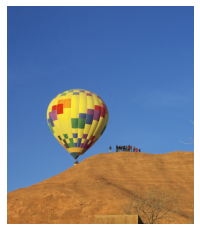

In [ ]:
import matplotlib.pyplot as plt

# Load input image and AMR features
image = plt.imread('/content/ballooning_0.jpg')
amr_features = calculate_amr_features(image)

# Set threshold for selecting regions
threshold = 0.5

# Crop image to AMR regions above threshold
cropped_image = crop_to_amr(image, amr_features, threshold)

# Display cropped image
plt.imshow(cropped_image)
plt.axis('off')
plt.show()


[0.04941309 0.         0.16305487 ... 0.01456811 0.05380442 0.        ]
1200


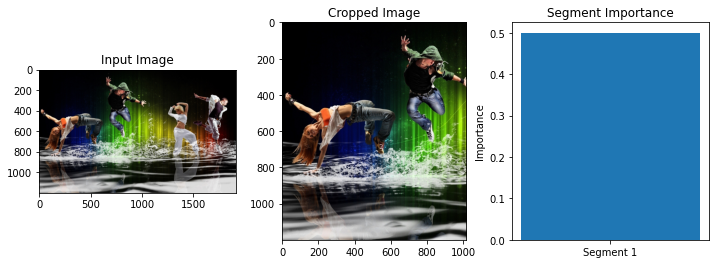

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.measure import label, regionprops
from skimage.transform import resize

def extract_amr_features(image):
    # TODO: Implement AMR feature extraction
    pass

def crop_to_amr(image, amr_features, threshold):
    # Normalize feature values to [0, 1]
    feature_min = np.min(amr_features)
    feature_max = np.max(amr_features)
    feature_range = feature_max - feature_min
    amr_features_norm = (amr_features - feature_min) / feature_range
    
    # Resize feature vector to match image size
    amr_features_resized = resize(amr_features_norm, image.shape[:2], order=0, anti_aliasing=False)
    
    # Generate binary mask for regions above threshold
    mask = np.zeros_like(image, dtype=np.uint8)
    mask[amr_features_resized > threshold] = 1
    
    # Label connected regions in mask
    label_image = label(mask)
    
    # Find largest connected region
    largest_region = None
    largest_area = 0
    for region in regionprops(label_image):
        if region.area > largest_area:
            largest_region = region
            largest_area = region.area
    
    # Crop image to bounding box of largest region
    bbox = largest_region.bbox
    min_row = np.min(bbox[0::2])
    min_col = np.min(bbox[1::2])
    max_row = np.max(bbox[0::2])
    max_col = np.max(bbox[1::2])
    cropped_image = image[min_row:max_row, min_col:max_col]
    
    # Create binary mask for cropped image
    cropped_mask = np.zeros_like(image, dtype=np.uint8)
    cropped_mask[min_row:max_row, min_col:max_col] = 1
    
    return cropped_image, cropped_mask

def extract_segments(image, mask):
    # Label connected regions in mask
    label_image = label(mask)
    
    # Extract segments as arrays of pixels
    segments = []
    for region in regionprops(label_image):
        segments.append(image * (label_image == region.label))
    
    return segments

def compute_segment_importance(image, segments):
    # Compute measure of segment importance
    segment_importance = []
    for segment in segments:
        # print(np.sum(segment) / np.sum(image))
        segment_importance.append(np.sum(segment) / np.sum(image))
    
    return segment_importance

# Load input image
image = plt.imread('/content/dancing_7.jpg')

# Extract AMR features and set threshold
amr_features = calculate_amr_features(image)
threshold = 0.5

# Crop image to AMR regions above threshold and generate binary mask
cropped_image, cropped_mask = crop_to_amr(image, amr_features, threshold)

# Extract segments from original image using binary mask
segments = extract_segments(image, cropped_mask)
# Compute measure of segment importance
segment_importance = compute_segment_importance(image, segments)
print(len(segments[0]))
# Display results
# fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(12, 4))
# ax1.imshow(image)
# ax1.set_title('Input Image')
# ax2.imshow(cropped_image)
# Display results
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(12, 4))
ax1.imshow(image)
ax1.set_title('Input Image')
ax2.imshow(cropped_image)
ax2.set_title('Cropped Image')
ax3.bar(range(len(segments)), segment_importance)
ax3.set_xticks(range(len(segments)))
ax3.set_xticklabels(['Segment {}'.format(i+1) for i in range(len(segments))])
ax3.set_ylabel('Importance')
ax3.set_title('Segment Importance')
plt.show()


In [ ]:


import numpy as np
from skimage.segmentation import quickshift
from skimage.feature import hog
from skimage.color import rgb2gray
from skimage.filters import sobel_h, sobel_v

def calculate_segment_importance(image):
    # Convert the image to grayscale
    gray_image = rgb2gray(image)

    # Calculate the gradient magnitude and orientation of the image
    gradient_magnitude = np.sqrt(sobel_h(gray_image) ** 2 + sobel_v(gray_image) ** 2)
    gradient_orientation = np.arctan2(sobel_v(gray_image), sobel_h(gray_image))

    # Calculate the HOG (Histogram of Oriented Gradients) features for the image
    hog_features = hog(gray_image, orientations=8, pixels_per_cell=(16, 16), cells_per_block=(1, 1))

    # Apply quickshift segmentation to the image
    segments = quickshift(image, kernel_size=5, max_dist=200, ratio=0.5)

    # Calculate the segment size and color histograms
    segment_sizes = np.bincount(segments.ravel())
    segment_histograms = np.zeros((len(segment_sizes), 64))
    for i in range(len(segment_sizes)):
        mask = segments == i
        segment_histograms[i] = np.histogram(gradient_orientation[mask], bins=8, range=(-np.pi, np.pi))[0]

    # Calculate the segment importance score based on the weighted combination of features
    segment_importance = np.zeros(len(segment_sizes))
    for i in range(len(segment_sizes)):
        size_weight = segment_sizes[i] / float(np.sum(segment_sizes))
        color_weight = np.sum(hog_features * segment_histograms[i]) / float(np.sum(segment_sizes))
        segment_importance[i] = size_weight + color_weight

    # Normalize the segment importance scores
    segment_importance_norm = segment_importance / np.max(segment_importance)

    # Return the normalized segment importance scores and the segmentation map
    return segment_importance_norm, segments


In [ ]:
image = plt.imread('/content/dragging_3.jpg')
calculate_segment_importance(image)

FileNotFoundError: ignored